<a href="https://colab.research.google.com/github/Mung-Tamjung/PETECTIVE-ai/blob/main/dog_breeds_training_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%cd "/content/drive/MyDrive"
!pip install -U -r yolov5/requirements.txt

/content/drive/MyDrive
  Using cached numpy-2.0.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (19.3 MB)


In [2]:
%cd "/content/drive/MyDrive/datasets"

/content/drive/MyDrive/datasets


In [3]:
!curl -L "https://app.roboflow.com/ds/mtwwXXek6Z?key=tPTweRc3jO" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   3710      0 --:--:-- --:--:-- --:--:--  3699
100 44.5M  100 44.5M    0     0  24.2M      0  0:00:01  0:00:01 --:--:-- 54.5M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
 extracting: test/images/Bichon167_jpg.rf.a43dca96019554c9649cb02dc71aeb7b.jpg  
 extracting: test/images/Bichon172_jpg.rf.e77fb44ef6539975a269c2bf6f0ecd42.jpg  
 extracting: test/images/Bichon175_jpg.rf.7495724fd4581b779b0c7eaa9c7acdbf.jpg  
 extracting: test/images/Bichon186_jpg.rf.a82ad621cadef3bd0c1548f7c6f11c9b.jpg  
 extracting: test/images/Bichon188_jpg.rf.122fbfd2b5e1f122116bf05448b8e33a.jpg  
 extracting: test/images/Bichon194_jpg.rf.a6fd7d0154859074ddb0480f5d5f68de

In [4]:
from glob import glob

# 이미지 경로 list로 넣기
train_img_list = glob('/content/drive/MyDrive/datasets/train/images/*.jpg') + glob('/content/drive/MyDrive/datasets/train/images/*.jpeg') + glob('/content/drive/MyDrive/datasets/train/images/*.png')
valid_img_list = glob('/content/drive/MyDrive/datasets/valid/images/*.jpg') + glob('/content/drive/MyDrive/datasets/valid/images/*.jpeg') + glob('./content/drive/MyDrive/datasets/valid/images/*.png')
test_img_list = glob('/content/drive/MyDrive/datasets/test/images/*.jpg') + glob('/content/drive/MyDrive/datasets/test/images/*.jpeg') + glob('./content/drive/MyDrive/datasets/test/images/*.png')


# txt 파일에 write
with open('/content/drive/MyDrive/datasets/train.txt', 'w') as f:
	f.write('\n'.join(train_img_list) + '\n')

with open('/content/drive/MyDrive/datasets/valid.txt', 'w') as f:
	f.write('\n'.join(valid_img_list) + '\n')

with open('/content/drive/MyDrive/datasets/test.txt', 'w') as f:
	f.write('\n'.join(test_img_list) + '\n')

In [7]:
import yaml

with open('/content/drive/MyDrive/datasets/data.yaml', 'r') as f:
	data = yaml.safe_load(f)

print(data)

data['train'] = '/content/drive/MyDrive/datasets/train.txt'
data['val'] = '/content/drive/MyDrive/datasets/valid.txt'
data['test'] = '/content/drive/MyDrive/datasets/test.txt'

with open('/content/drive/MyDrive/datasets/data.yaml', 'w') as f:
	yaml.dump(data, f)


{'names': ['Bichon', 'Chihuahua', 'Maltese', 'Pomeranian', 'Poodle'], 'nc': 5, 'roboflow': {'license': 'CC BY 4.0', 'project': 'dog-breeds-heriv', 'url': 'https://universe.roboflow.com/petective/dog-breeds-heriv/dataset/4', 'version': 4, 'workspace': 'petective'}, 'test': '/content/drive/MyDrive/datasets/test.txt', 'train': '/content/drive/MyDrive/datasets/train.txt', 'val': '../valid/images', 'valid': '/content/drive/MyDrive/datasets/valid.txt'}


In [8]:
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [9]:
!python train.py --img 640 --batch 16 --epochs 50 --data /content/drive/MyDrive/datasets/data.yaml \
--cfg ./models/yolov5s.yaml --weights yolov5s.pt --name dog_breeds_training_4

2024-06-30 04:24:12.893525: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-30 04:24:12.893574: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-30 04:24:13.006345: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/drive/MyDrive/datasets/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False

In [10]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage.jpeg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/testimage/testimage.jpeg: 640x640 (no detections), 17.1ms
Speed: 0.8ms pre-process, 17.1ms inference, 25.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp32


In [11]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage.jpeg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/testimage/testimage.jpeg: 640x640 (no detections), 11.5ms
Speed: 0.6ms pre-process, 11.5ms inference, 40.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp33


In [12]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage11.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage11.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage11.jpg: 640x640 1 Poodle, 11.6ms
Speed: 0.7ms pre-process, 11.6ms inference, 679.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp

In [13]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage11.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage11.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/testimage/testimage11.jpg: 640x640 1 Poodle, 11.5ms
Speed: 0.6ms pre-process, 11.5ms inference, 481.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp35


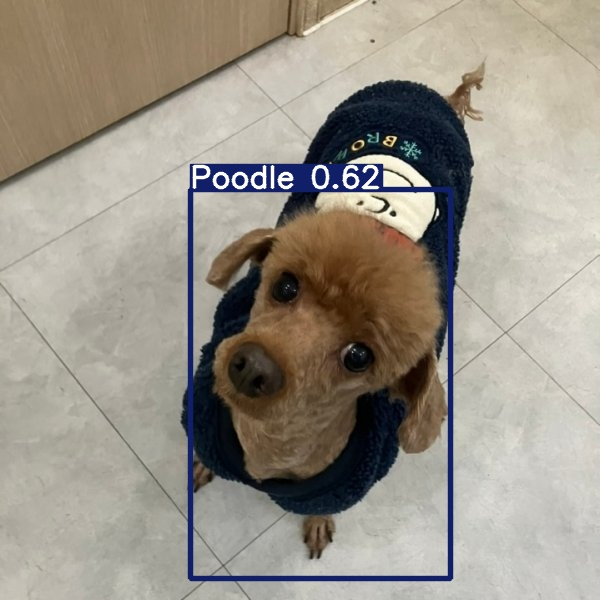

In [14]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp34/testimage11.jpg')
cv2_imshow(img)

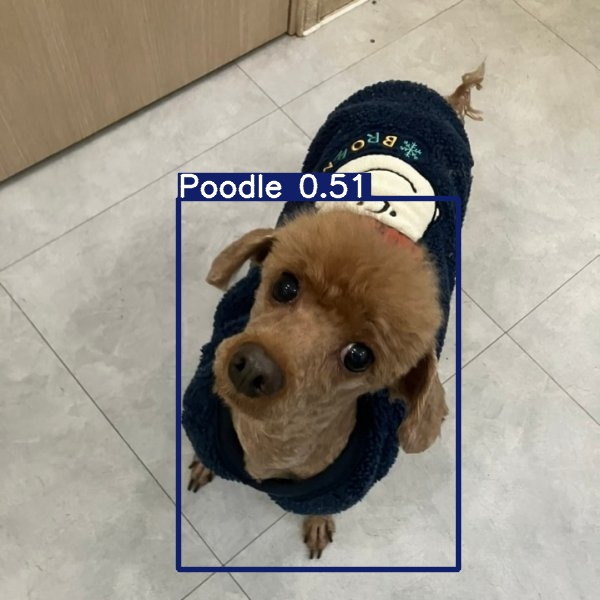

In [15]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp35/testimage11.jpg')
cv2_imshow(img)

In [16]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage6.jpeg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage6.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage6.jpeg: 640x384 1 Chihuahua, 50.9ms
Speed: 0.6ms pre-process, 50.9ms inference, 578.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/

In [17]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage6.jpeg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage6.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage6.jpeg: 640x384 1 Chihuahua, 54.0ms
Speed: 0.5ms pre-process, 54.0ms inference, 584.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/

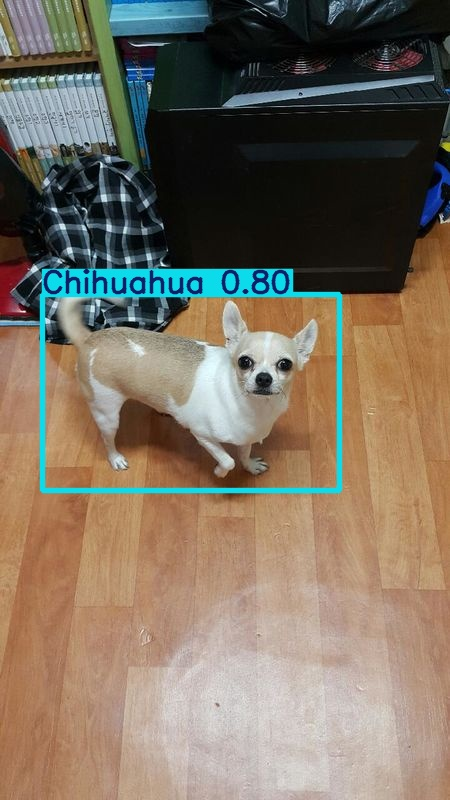

In [18]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp36/testimage6.jpeg')
cv2_imshow(img)

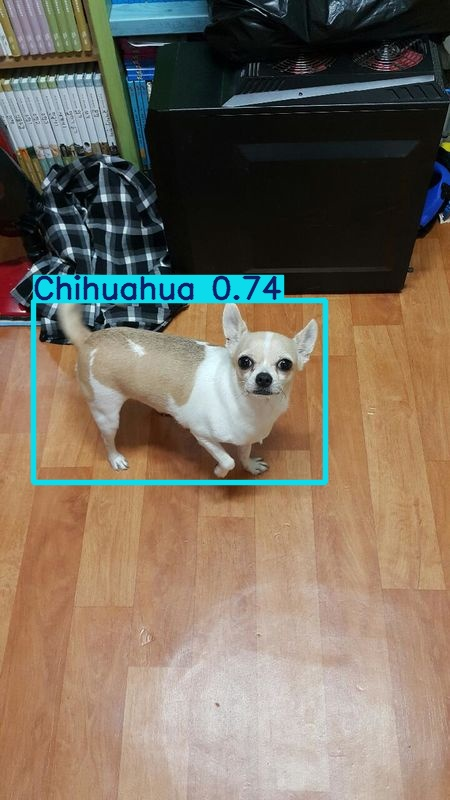

In [21]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp37/testimage6.jpeg')
cv2_imshow(img)

In [24]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage7.jpeg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage7.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/testimage/testimage7.jpeg: 384x640 1 Bichon, 49.6ms
Speed: 0.6ms pre-process, 49.6ms inference, 528.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp40


In [25]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage7.jpeg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage7.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage7.jpeg: 384x640 1 Bichon, 47.7ms
Speed: 0.5ms pre-process, 47.7ms inference, 623.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp

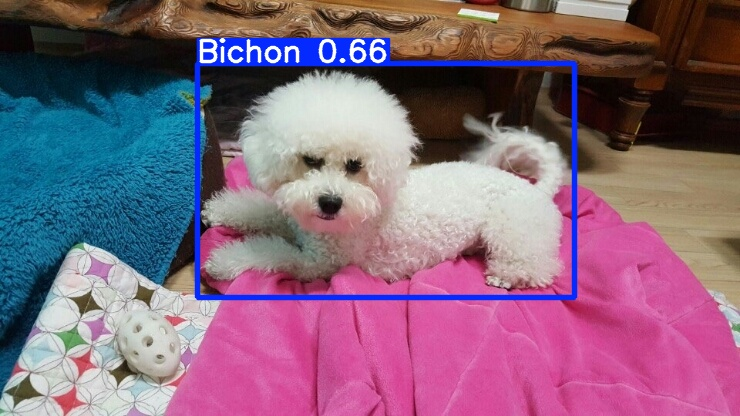

In [26]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp40/testimage7.jpeg')
cv2_imshow(img)

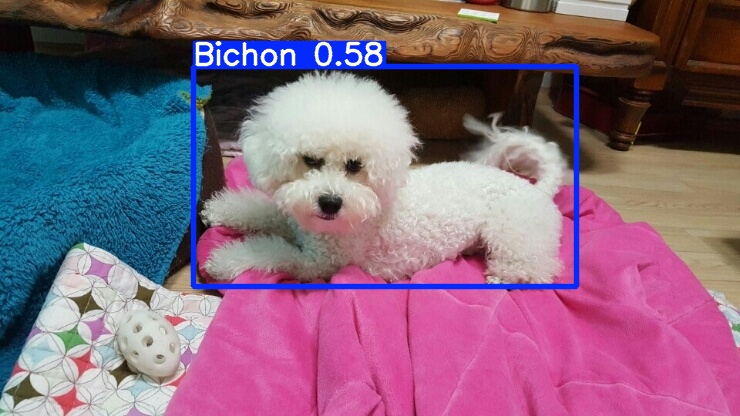

In [27]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp41/testimage7.jpeg')
cv2_imshow(img)

In [28]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage10.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage10.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage10.jpg: 640x480 1 Chihuahua, 49.1ms
Speed: 0.8ms pre-process, 49.1ms inference, 585.5ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/

In [29]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage10.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage10.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage10.jpg: 640x480 1 Chihuahua, 48.8ms
Speed: 0.6ms pre-process, 48.8ms inference, 588.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/

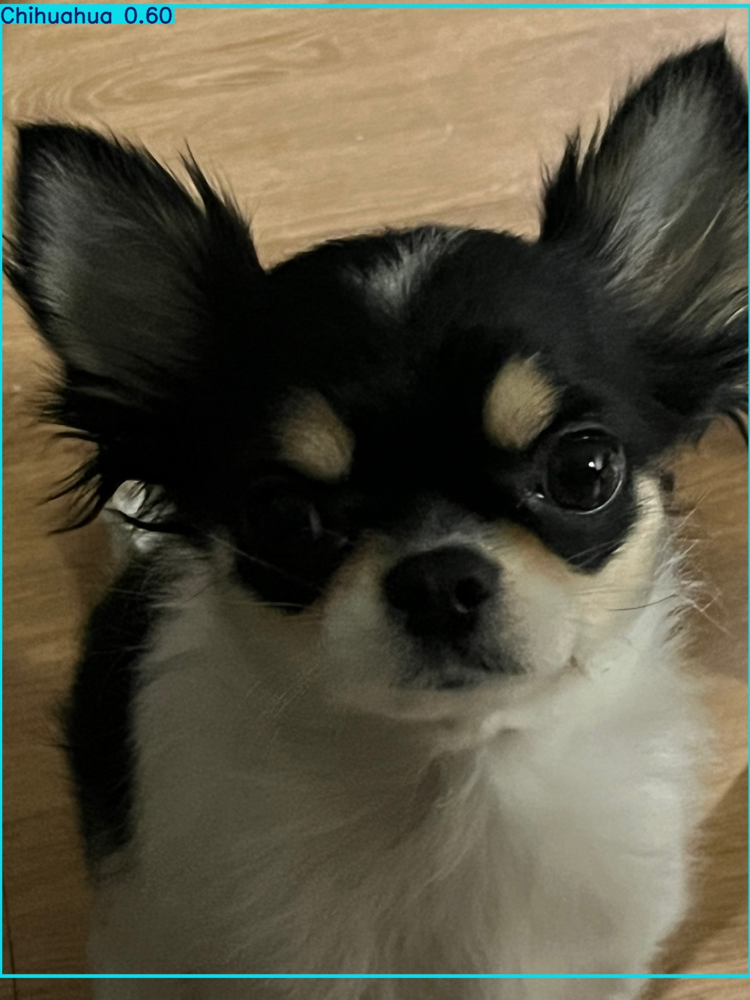

In [30]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp42/testimage10.jpg')
cv2_imshow(img)

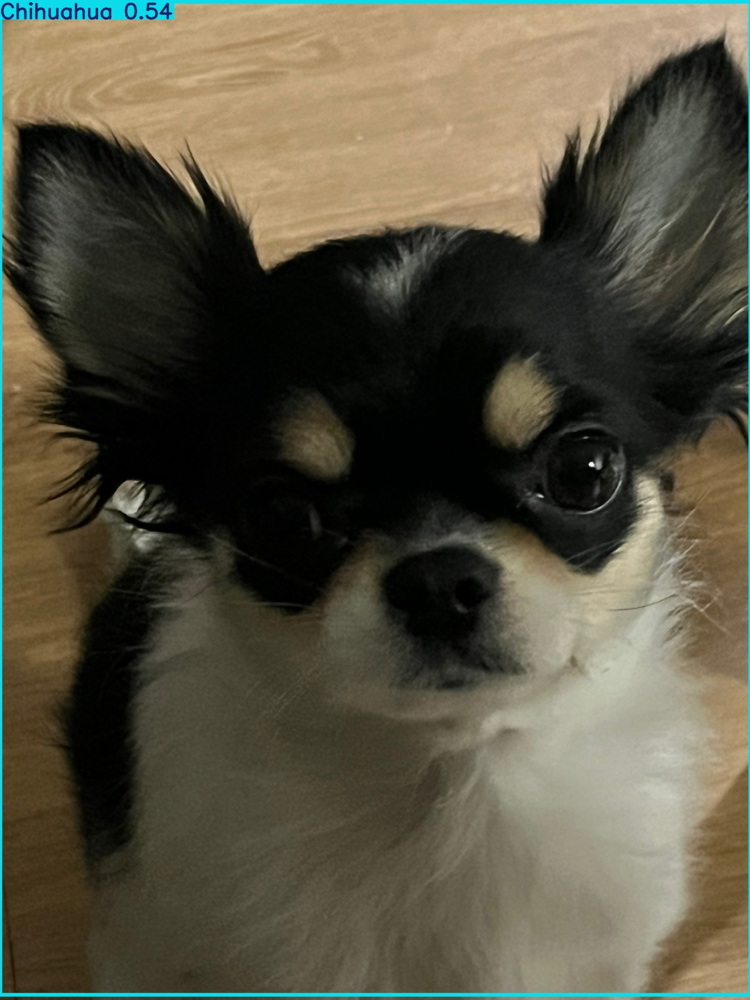

In [31]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp43/testimage10.jpg')
cv2_imshow(img)

In [32]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage18.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage18.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/testimage/testimage18.jpg: 640x384 1 Pomeranian, 48.7ms
Speed: 0.6ms pre-process, 48.7ms inference, 475.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp44


In [33]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage18.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage18.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage18.jpg: 640x384 1 Pomeranian, 48.9ms
Speed: 0.5ms pre-process, 48.9ms inference, 584.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect

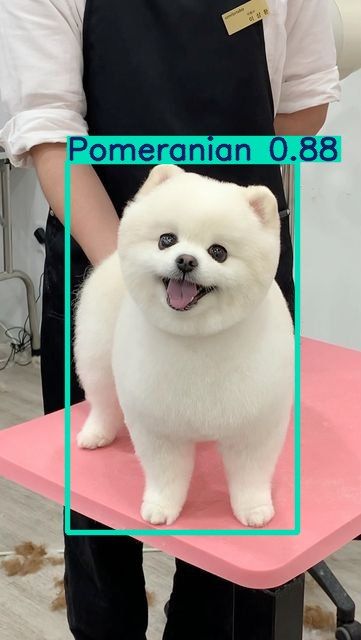

In [34]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp44/testimage18.jpg')
cv2_imshow(img)

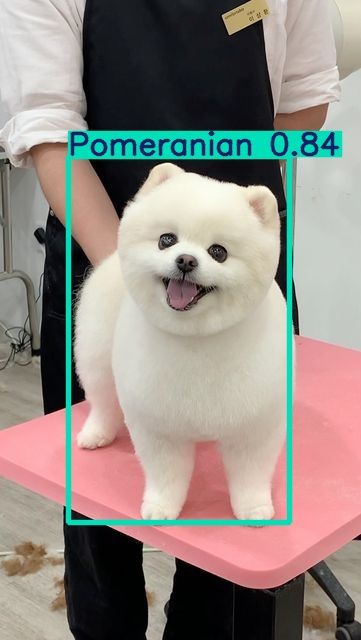

In [35]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp45/testimage18.jpg')
cv2_imshow(img)

In [41]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage13.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_3/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage13.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/testimage/testimage13.jpg: 640x640 1 Maltese, 11.6ms
Speed: 0.8ms pre-process, 11.6ms inference, 802.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/ex

In [42]:
!python /content/drive/MyDrive/yolov5/detect.py --weights /content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt --img 640 --conf 0.5 --source /content/drive/MyDrive/testimage/testimage13.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/dog_breeds_training_4/weights/best.pt'], source=/content/drive/MyDrive/testimage/testimage13.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/testimage/testimage13.jpg: 640x640 1 Maltese, 11.5ms
Speed: 0.6ms pre-process, 11.5ms inference, 530.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp49


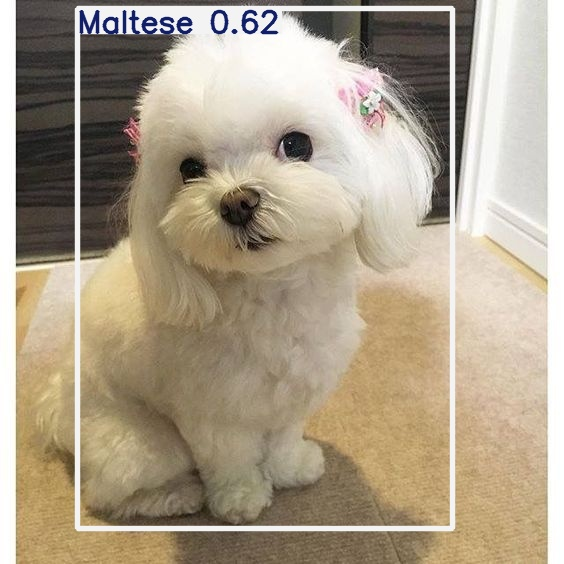

In [43]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp48/testimage13.jpg')
cv2_imshow(img)

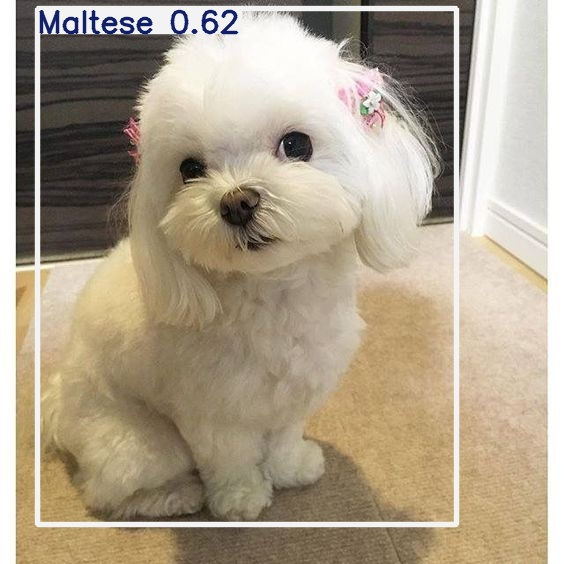

In [44]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/yolov5/runs/detect/exp49/testimage13.jpg')
cv2_imshow(img)